In [178]:
# Import the required libraries and dependencies
import os
import pandas as pd
from pathlib import Path
import sqlalchemy
from sodapy import Socrata
import matplotlib.pyplot as plt
import hvplot.pandas
import numpy as np
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [179]:

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
# client = Socrata("data.seattle.gov", None)

# # Example authenticated client (needed for non-public datasets):
# # client = Socrata(data.seattle.gov,
# #                  MyAppToken,
# #                  username="user@example.com",
# #                  password="AFakePassword")

# # First 2000 results, returned as JSON from API / converted to Python list of
# # dictionaries by sodapy.
# results = client.get("tazs-3rd5", limit=1000000)

# # Convert to pandas DataFrame
# results_df = pd.DataFrame.from_records(results)
# results_df

In [180]:
# use pandas to read the first csv file "SPD_Crimes_Early.csv"
spd_crimes_early = pd.read_csv("./Resources/SPD_Crimes_Early.csv", index_col='Report Number')

# display the dateframe
spd_crimes_early

,Offense ID,Offense Start DateTime,Offense End DateTime,Report DateTime,Group A B,Crime Against Category,Offense Parent Group,Offense,Offense Code,Precinct,Sector,Beat,MCPP,100 Block Address,Longitude,Latitude
Report Number,,,,,,,,,,,,,,,,
2020-044620,12605873663,02/05/2020 10:10:00 AM,NaN,02/05/2020 11:24:31 AM,A,SOCIETY,DRUG/NARCOTIC OFFENSES,Drug/Narcotic Violations,35A,W,Q,Q1,MAGNOLIA,32XX BLOCK OF 23RD AVE W,-122.385974,47.649387
2020-044452,12605598696,02/03/2020 08:00:00 AM,02/04/2020 08:00:00 AM,02/05/2020 10:06:28 AM,A,PROPERTY,LARCENY-THEFT,Theft of Motor Vehicle Parts or Accessories,23G,N,J,J3,ROOSEVELT/RAVENNA,63XX BLOCK OF 5TH AVE NE,-122.323399,47.675118
2020-044465,12605567653,02/02/2020 08:30:00 PM,02/02/2020 09:30:00 PM,02/05/2020 09:39:33 AM,A,PROPERTY,ROBBERY,Robbery,120,N,U,U3,ROOSEVELT/RAVENNA,26TH AVE NE / NE BLAKELEY ST,-122.299552,47.666384
2020-044225,12605174036,02/05/2020 01:17:00 AM,02/05/2020 02:21:00 AM,02/05/2020 03:30:55 AM,A,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property,290,W,Q,Q1,MAGNOLIA,22XX BLOCK OF W RAYE ST,-122.384865,47.642927
2020-044076,12605081469,02/05/2020 12:51:21 AM,NaN,02/05/2020 12:51:31 AM,B,SOCIETY,DRIVING UNDER THE INFLUENCE,Driving Under the Influence,90D,N,B,B2,BALLARD SOUTH,NW 46TH ST / 8TH AVE NW,-122.366195,47.662193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-263863,7657648648,08/10/2012 01:30:00 PM,NaN,08/10/2012 01:30:00 PM,A,PROPERTY,LARCENY-THEFT,Shoplifting,23C,E,E,E2,CAPITOL HILL,14XX BLOCK OF BROADWAY,-122.320771,47.613520
2012-263863,7657648650,08/10/2012 01:30:00 PM,NaN,08/10/2012 01:30:00 PM,A,SOCIETY,WEAPON LAW VIOLATIONS,Weapon Law Violations,520,E,E,E2,CAPITOL HILL,14XX BLOCK OF BROADWAY,-122.320771,47.613520
2012-263851,7648063641,08/10/2012 01:23:00 PM,NaN,08/10/2012 01:23:00 PM,A,PROPERTY,COUNTERFEITING/FORGERY,Counterfeiting/Forgery,250,S,S,S3,RAINIER BEACH,90XX BLOCK OF RAINIER AVE S,-122.269988,47.522816


In [181]:
# drop any unnecessary columns
spd_crimes_early_revised = spd_crimes_early.drop(columns=[
    'Offense ID', 
    'Group A B', 
    'Offense Start DateTime', 
    'Offense End DateTime', 
    '100 Block Address',
    'Offense Code',
    'Precinct',
    'Sector',
    'Beat',
])

# display the dataframe
spd_crimes_early_revised

,Report DateTime,Crime Against Category,Offense Parent Group,Offense,MCPP,Longitude,Latitude
Report Number,,,,,,,
2020-044620,02/05/2020 11:24:31 AM,SOCIETY,DRUG/NARCOTIC OFFENSES,Drug/Narcotic Violations,MAGNOLIA,-122.385974,47.649387
2020-044452,02/05/2020 10:06:28 AM,PROPERTY,LARCENY-THEFT,Theft of Motor Vehicle Parts or Accessories,ROOSEVELT/RAVENNA,-122.323399,47.675118
2020-044465,02/05/2020 09:39:33 AM,PROPERTY,ROBBERY,Robbery,ROOSEVELT/RAVENNA,-122.299552,47.666384
2020-044225,02/05/2020 03:30:55 AM,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property,MAGNOLIA,-122.384865,47.642927
2020-044076,02/05/2020 12:51:31 AM,SOCIETY,DRIVING UNDER THE INFLUENCE,Driving Under the Influence,BALLARD SOUTH,-122.366195,47.662193
...,...,...,...,...,...,...,...
2012-263863,08/10/2012 01:30:00 PM,PROPERTY,LARCENY-THEFT,Shoplifting,CAPITOL HILL,-122.320771,47.613520
2012-263863,08/10/2012 01:30:00 PM,SOCIETY,WEAPON LAW VIOLATIONS,Weapon Law Violations,CAPITOL HILL,-122.320771,47.613520
2012-263851,08/10/2012 01:23:00 PM,PROPERTY,COUNTERFEITING/FORGERY,Counterfeiting/Forgery,RAINIER BEACH,-122.269988,47.522816


In [182]:
# check the file for duplicate information
spd_crimes_early_revised.duplicated().sum()

2369

In [183]:
# drop any duplicated data
spd_crimes_early_revised = spd_crimes_early_revised.drop_duplicates()

# check that there is no more duplicate information
spd_crimes_early_revised.duplicated().sum()

0

In [184]:
# check the file for any null information
spd_crimes_early_revised.isnull().sum()

Report DateTime           0
Crime Against Category    0
Offense Parent Group      0
Offense                   0
MCPP                      0
Longitude                 0
Latitude                  0
dtype: int64

In [185]:
# check data types
spd_crimes_early_revised.dtypes

Report DateTime            object
Crime Against Category     object
Offense Parent Group       object
Offense                    object
MCPP                       object
Longitude                 float64
Latitude                  float64
dtype: object

In [186]:
# use pandas to read the second csv file "SPD_Crimes_Middle.csv"
spd_crimes_middle = pd.read_csv("./Resources/SPD_Crimes_Middle.csv", index_col='Report Number')

# display the dataframe
spd_crimes_middle

,Offense ID,Offense Start DateTime,Offense End DateTime,Report DateTime,Group A B,Crime Against Category,Offense Parent Group,Offense,Offense Code,Precinct,Sector,Beat,MCPP,100 Block Address,Longitude,Latitude
Report Number,,,,,,,,,,,,,,,,
2012-263978,7682451747,08/10/2012 01:00:00 PM,NaN,08/10/2012 01:00:00 PM,A,SOCIETY,DRUG/NARCOTIC OFFENSES,Drug Equipment Violations,35B,W,M,M3,DOWNTOWN COMMERCIAL,15XX BLOCK OF 3RD AVE,-122.338247,47.610246
2012-263819,7697933853,08/09/2012 05:30:00 PM,08/09/2012 06:45:00 PM,08/10/2012 12:54:00 PM,A,PROPERTY,LARCENY-THEFT,Theft From Building,23D,N,L,L2,NORTHGATE,5XX BLOCK OF NE 103RD ST,-122.321798,47.703131
2012-263580,7691687490,08/09/2012 08:15:00 AM,08/09/2012 03:00:00 PM,08/10/2012 12:51:00 PM,A,PROPERTY,LARCENY-THEFT,Theft From Motor Vehicle,23F,W,M,M3,DOWNTOWN COMMERCIAL,12XX BLOCK OF 4TH AVE,-122.334540,47.607871
2012-903565,7675128577,08/09/2012 12:00:00 AM,08/09/2012 06:00:00 AM,08/10/2012 12:48:00 PM,A,PROPERTY,LARCENY-THEFT,Theft From Motor Vehicle,23F,W,Q,Q2,QUEEN ANNE,13XX BLOCK OF W DRAVUS ST,-122.374232,47.648473
2012-263745,7626650246,08/10/2012 11:40:00 AM,NaN,08/10/2012 12:20:00 PM,A,PROPERTY,LARCENY-THEFT,Purse-snatching,23B,S,S,S1,NEW HOLLY,76XX BLOCK OF 40TH AVE S,-122.281847,47.533776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-431853,7672351232,12/18/2012 11:25:00 PM,NaN,12/18/2012 11:25:00 PM,A,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,220,E,E,E2,CAPITOL HILL,18XX BLOCK OF BOYLSTON AVE,-122.323447,47.617653
2012-431644,7666883640,12/18/2012 07:22:00 PM,12/18/2012 09:22:00 PM,12/18/2012 09:22:00 PM,A,PERSON,ASSAULT OFFENSES,Simple Assault,13B,SW,F,F2,SOUTH DELRIDGE,94XX BLOCK OF 20TH AVE SW,-122.359191,47.518279
2012-431725,7625888246,12/18/2012 07:00:00 PM,12/18/2012 08:00:00 PM,12/18/2012 09:07:00 PM,A,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,220,W,M,M1,BELLTOWN,19XX BLOCK OF 1ST AVE,-122.341960,47.610682


In [187]:
# reorganized spd crimes middle dataframe by dropping columns
spd_crimes_middle_revised = spd_crimes_middle.drop(columns=[
    'Offense ID', 
    'Group A B', 
    'Offense Start DateTime', 
    'Offense End DateTime', 
    '100 Block Address',
    'Offense Code',
    'Precinct',
    'Sector',
    'Beat',
])

# display the dataframe
spd_crimes_middle_revised

,Report DateTime,Crime Against Category,Offense Parent Group,Offense,MCPP,Longitude,Latitude
Report Number,,,,,,,
2012-263978,08/10/2012 01:00:00 PM,SOCIETY,DRUG/NARCOTIC OFFENSES,Drug Equipment Violations,DOWNTOWN COMMERCIAL,-122.338247,47.610246
2012-263819,08/10/2012 12:54:00 PM,PROPERTY,LARCENY-THEFT,Theft From Building,NORTHGATE,-122.321798,47.703131
2012-263580,08/10/2012 12:51:00 PM,PROPERTY,LARCENY-THEFT,Theft From Motor Vehicle,DOWNTOWN COMMERCIAL,-122.334540,47.607871
2012-903565,08/10/2012 12:48:00 PM,PROPERTY,LARCENY-THEFT,Theft From Motor Vehicle,QUEEN ANNE,-122.374232,47.648473
2012-263745,08/10/2012 12:20:00 PM,PROPERTY,LARCENY-THEFT,Purse-snatching,NEW HOLLY,-122.281847,47.533776
...,...,...,...,...,...,...,...
2012-431853,12/18/2012 11:25:00 PM,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,CAPITOL HILL,-122.323447,47.617653
2012-431644,12/18/2012 09:22:00 PM,PERSON,ASSAULT OFFENSES,Simple Assault,SOUTH DELRIDGE,-122.359191,47.518279
2012-431725,12/18/2012 09:07:00 PM,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,BELLTOWN,-122.341960,47.610682


In [188]:
# check the file for duplicate information
spd_crimes_middle_revised.duplicated().sum()

2619

In [189]:
# drop any duplicated information
spd_crimes_middle_revised = spd_crimes_middle_revised.drop_duplicates()

# check that there is no more duplicate information
spd_crimes_middle_revised.duplicated().sum()

0

In [190]:
# drop null data
spd_crimes_middle_revised.isnull().sum()

Report DateTime           0
Crime Against Category    0
Offense Parent Group      0
Offense                   0
MCPP                      0
Longitude                 0
Latitude                  0
dtype: int64

In [191]:
# check data types
spd_crimes_middle_revised.dtypes

Report DateTime            object
Crime Against Category     object
Offense Parent Group       object
Offense                    object
MCPP                       object
Longitude                 float64
Latitude                  float64
dtype: object

In [192]:
# use pandas to read the third csv file "SPD_Crimes_Late.csv"
spd_crimes_late = pd.read_csv("./Resources/SPD_Crimes_Late.csv", index_col='Report Number')

# display the dataframe
spd_crimes_late

,Offense ID,Offense Start DateTime,Offense End DateTime,Report DateTime,Group A B,Crime Against Category,Offense Parent Group,Offense,Offense Code,Precinct,Sector,Beat,MCPP,100 Block Address,Longitude,Latitude
Report Number,,,,,,,,,,,,,,,,
2012-431647,7675045429,12/18/2012 07:34:00 PM,NaN,12/18/2012 07:34:00 PM,A,PERSON,ASSAULT OFFENSES,Intimidation,13C,W,M,M2,DOWNTOWN COMMERCIAL,15XX BLOCK OF 7TH AVE,-122.333808,47.612103
2012-431578,7681564329,12/17/2012 07:00:00 AM,12/18/2012 06:00:00 PM,12/18/2012 07:28:00 PM,A,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,220,W,Q,Q2,QUEEN ANNE,30XX BLOCK OF 11TH AVE W,-122.371535,47.647658
2012-431612,7647361288,01/03/2012 08:00:00 AM,12/18/2012 06:40:00 PM,12/18/2012 06:40:00 PM,A,PERSON,ASSAULT OFFENSES,Intimidation,13C,W,D,D3,SLU/CASCADE,11XX BLOCK OF FAIRVIEW AVE N,-122.328881,47.630301
2012-431500,7666250764,12/17/2012 06:29:00 PM,NaN,12/18/2012 06:29:00 PM,A,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,220,N,U,U1,UNIVERSITY,52XX BLOCK OF 19TH AVE NE,-122.307150,47.667464
2012-431593,7700051108,12/18/2012 06:23:00 PM,NaN,12/18/2012 06:23:00 PM,A,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,220,W,D,D2,QUEEN ANNE,24XX BLOCK OF DEXTER AVE N,-122.344275,47.639951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-247888,7687554356,07/13/2013 01:00:00 AM,NaN,07/13/2013 06:37:00 AM,A,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,240,SW,F,F1,PIGEON POINT,41XX BLOCK OF 20TH AVE SW,-122.359028,47.565702
2013-227022,7682354808,06/26/2013 11:00:00 AM,06/29/2013 06:30:00 AM,06/29/2013 09:43:00 AM,A,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,240,W,Q,Q3,QUEEN ANNE,1ST AVE N / VALLEY ST,-122.355386,47.626251
2012-045494,7672915592,02/14/2012 03:04:00 PM,NaN,02/14/2012 03:04:00 PM,A,PROPERTY,LARCENY-THEFT,Shoplifting,23C,N,U,U1,ROOSEVELT/RAVENNA,73XX BLOCK OF ROOSEVELT WAY NE,-122.317464,47.681894


In [193]:
spd_crimes_late_revised = spd_crimes_late.drop(columns=[
    'Offense ID', 
    'Group A B', 
    'Offense Start DateTime', 
    'Offense End DateTime', 
    '100 Block Address',
    'Offense Code',
    'Precinct',
    'Sector',
    'Beat',
])

# display the dataframe
spd_crimes_late_revised

,Report DateTime,Crime Against Category,Offense Parent Group,Offense,MCPP,Longitude,Latitude
Report Number,,,,,,,
2012-431647,12/18/2012 07:34:00 PM,PERSON,ASSAULT OFFENSES,Intimidation,DOWNTOWN COMMERCIAL,-122.333808,47.612103
2012-431578,12/18/2012 07:28:00 PM,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,QUEEN ANNE,-122.371535,47.647658
2012-431612,12/18/2012 06:40:00 PM,PERSON,ASSAULT OFFENSES,Intimidation,SLU/CASCADE,-122.328881,47.630301
2012-431500,12/18/2012 06:29:00 PM,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,UNIVERSITY,-122.307150,47.667464
2012-431593,12/18/2012 06:23:00 PM,PROPERTY,BURGLARY/BREAKING&ENTERING,Burglary/Breaking & Entering,QUEEN ANNE,-122.344275,47.639951
...,...,...,...,...,...,...,...
2013-247888,07/13/2013 06:37:00 AM,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,PIGEON POINT,-122.359028,47.565702
2013-227022,06/29/2013 09:43:00 AM,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,QUEEN ANNE,-122.355386,47.626251
2012-045494,02/14/2012 03:04:00 PM,PROPERTY,LARCENY-THEFT,Shoplifting,ROOSEVELT/RAVENNA,-122.317464,47.681894


In [194]:
# check the file for duplicate information
spd_crimes_late_revised.duplicated().sum()

1117

In [195]:
# drop any duplicated information
spd_crimes_late_revised = spd_crimes_late_revised.drop_duplicates()

# check that there is no more duplicate information
spd_crimes_late_revised.duplicated().sum()

0

In [196]:
# drop any null data
spd_crimes_late_revised.isnull().sum()

Report DateTime           0
Crime Against Category    0
Offense Parent Group      0
Offense                   0
MCPP                      0
Longitude                 0
Latitude                  0
dtype: int64

In [197]:
# check data types
spd_crimes_late_revised.dtypes

Report DateTime            object
Crime Against Category     object
Offense Parent Group       object
Offense                    object
MCPP                       object
Longitude                 float64
Latitude                  float64
dtype: object

In [198]:
# join all three dataframes together
concat = pd.concat([spd_crimes_early_revised, spd_crimes_middle_revised, spd_crimes_late_revised]).sort_values("Report DateTime", ascending=True)
concat

,Report DateTime,Crime Against Category,Offense Parent Group,Offense,MCPP,Longitude,Latitude
Report Number,,,,,,,
2008-000136,01/01/2008 01:00:00 AM,PERSON,ASSAULT OFFENSES,Simple Assault,QUEEN ANNE,-122.347594,47.621757
2008-000136,01/01/2008 01:00:00 AM,PERSON,ASSAULT OFFENSES,Aggravated Assault,QUEEN ANNE,-122.347594,47.621757
2008-000645,01/01/2008 01:00:00 PM,PROPERTY,LARCENY-THEFT,Shoplifting,DOWNTOWN COMMERCIAL,-122.338048,47.611706
2008-000645,01/01/2008 01:00:00 PM,SOCIETY,TRESPASS OF REAL PROPERTY,Trespass of Real Property,DOWNTOWN COMMERCIAL,-122.338048,47.611706
2008-000112,01/01/2008 01:07:00 AM,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property,UNIVERSITY,-122.311347,47.666424
...,...,...,...,...,...,...,...
2021-343355,12/31/2021 12:44:34 PM,SOCIETY,DRIVING UNDER THE INFLUENCE,Driving Under the Influence,HIGHLAND PARK,-122.360099,47.522861
2021-343281,12/31/2021 12:47:56 PM,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,BITTERLAKE,-122.344721,47.706707
2021-343337,12/31/2021 12:50:53 PM,SOCIETY,WEAPON LAW VIOLATIONS,Weapon Law Violations,CENTRAL AREA/SQUIRE PARK,0.000000,0.000000


In [199]:
# calculate the amount of occurrence per each crime type
occurrence_df = concat.groupby(["Offense Parent Group"]).size()
occurrence_df

Offense Parent Group
ANIMAL CRUELTY                                 122
ARSON                                         1794
ASSAULT OFFENSES                            144998
BAD CHECKS                                    6595
BRIBERY                                         16
BURGLARY/BREAKING&ENTERING                  114372
COUNTERFEITING/FORGERY                        5208
CURFEW/LOITERING/VAGRANCY VIOLATIONS           900
DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY     93971
DRIVING UNDER THE INFLUENCE                  17902
DRUG/NARCOTIC OFFENSES                       24817
DRUNKENNESS                                     20
EMBEZZLEMENT                                  1972
EXTORTION/BLACKMAIL                            842
FAMILY OFFENSES, NONVIOLENT                  10186
FRAUD OFFENSES                               58287
GAMBLING OFFENSES                               27
HOMICIDE OFFENSES                              474
HUMAN TRAFFICKING                               53
KIDNAPPING

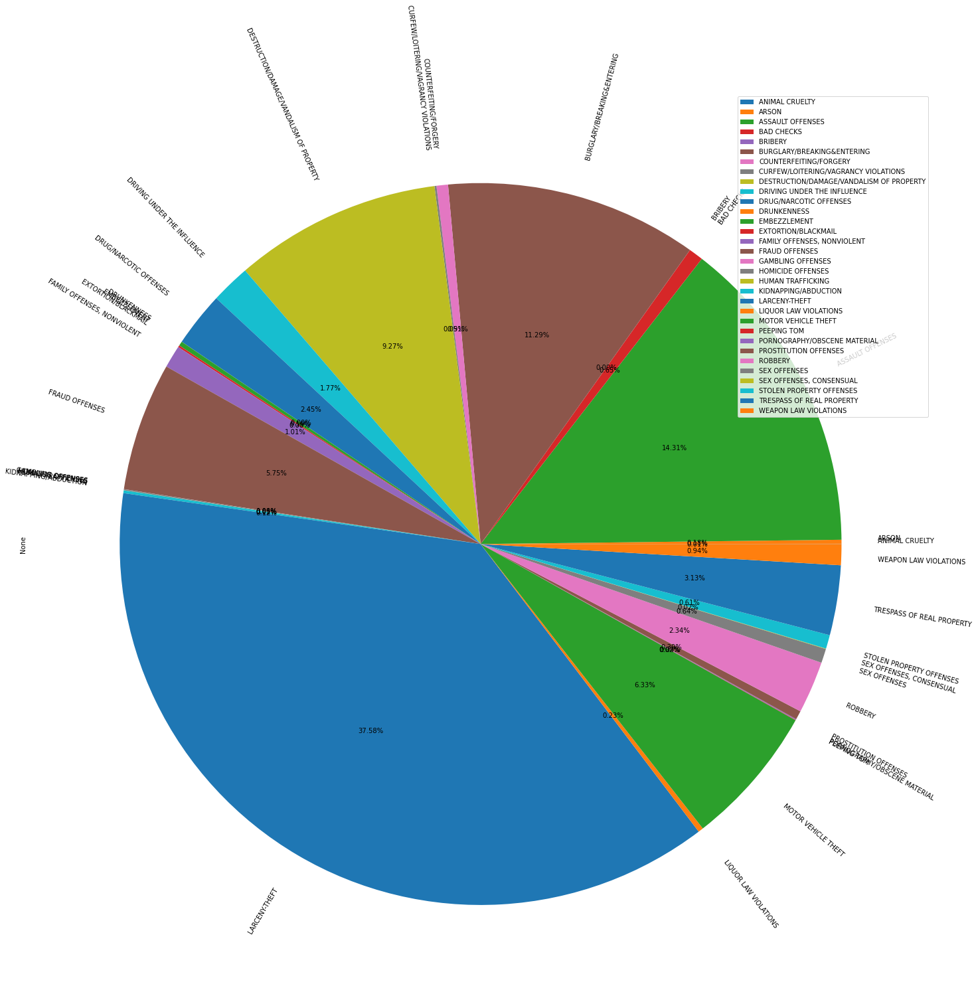

In [200]:
# create a pie plot
occurrence_df_plot = occurrence_df.plot(
    kind="pie",
    figsize=(25, 25),
    autopct='%1.2f%%',
    #explode=explode,
    rotatelabels=True
)

occurrence_df_plot.legend(loc="upper right")


In [201]:
# calculate the amount of occurrences per date
occurrence_by_date_df = concat.groupby(["Report DateTime","Offense Parent Group"]).size()
occurrence_by_date_df

Report DateTime         Offense Parent Group                    
01/01/2008 01:00:00 AM  ASSAULT OFFENSES                            2
01/01/2008 01:00:00 PM  LARCENY-THEFT                               1
                        TRESPASS OF REAL PROPERTY                   1
01/01/2008 01:07:00 AM  DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY    1
01/01/2008 01:08:00 AM  ASSAULT OFFENSES                            1
                                                                   ..
12/31/2021 12:44:34 PM  DRIVING UNDER THE INFLUENCE                 1
12/31/2021 12:47:56 PM  MOTOR VEHICLE THEFT                         1
12/31/2021 12:50:53 PM  ASSAULT OFFENSES                            1
                        WEAPON LAW VIOLATIONS                       1
12/31/2021 12:56:55 AM  ROBBERY                                     1
Length: 994083, dtype: int64

In [202]:
# create an interactive plot
occurrence_by_date_plot = occurrence_by_date_df.hvplot.line(x="Report DateTime", ylabel="Amount of Occurrences",
                                                            groupby="Offense Parent Group",
                                                            title="2008-2021 Amount of Crimes in Seattle by Report Date and Type",
                                                            rot=90, frame_height=400, frame_width=2000)
occurrence_by_date_plot

:DynamicMap   [Offense Parent Group]
   :Curve   [Report DateTime]   (0)

In [203]:
# calculate the mean amount of occurrences per date
# create an interactive plot
#Keenan

In [204]:
# calculate the amount of occurrences per neighborhood
# create an interactive plot
# create a geoviews plot using groupby
#Keenan 

In [205]:
# calculate the mean amount of occurrences per neighborhood
# create an interactive plot
# create a geoviews plot using groupbyl
#Ariana

In [206]:
# calculate the amount of occurrences by neighborhood AND date
# create an interactive plot using groupby
#Ariana

In [207]:
# calculate the mean amount of occurrences by neighborhood AND date
# create an interactive plot using groupby
#Audell

In [208]:
# calculate the amount of occurrences by date for October 1, 2008 - December 31, 2008
# create an interactive plot
#Audell

In [209]:
# calculate the amount of occurrences by date for October 1, 2012 - December 31, 2012
concat_2012_df = concat[concat['Report DateTime'].str.contains('2012')]
display(concat_2012_df.sort_values('Report DateTime', ascending=True))

concat_2012_occurences = concat_2012_df.groupby(["Report DateTime","Offense Parent Group"]).size()
display(concat_2012_occurences)

,Report DateTime,Crime Against Category,Offense Parent Group,Offense,MCPP,Longitude,Latitude
Report Number,,,,,,,
2012-000128,01/01/2012 01:01:00 AM,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property,BALLARD SOUTH,-122.391510,47.669461
2012-000619,01/01/2012 01:02:00 PM,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,WALLINGFORD,-122.332677,47.651222
2012-000588,01/01/2012 01:05:00 PM,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property,SOUTH BEACON HILL,-122.285957,47.520564
2012-000150,01/01/2012 01:08:00 AM,PROPERTY,ROBBERY,Robbery,PIONEER SQUARE,-122.335867,47.600883
2012-000053,01/01/2012 01:08:00 AM,PERSON,ASSAULT OFFENSES,Simple Assault,NORTHGATE,-122.328514,47.702272
...,...,...,...,...,...,...,...
2012-904813,12/31/2012 12:37:00 PM,PROPERTY,LARCENY-THEFT,All Other Larceny,DOWNTOWN COMMERCIAL,-122.333808,47.612103
2012-445278,12/31/2012 12:39:00 PM,PROPERTY,MOTOR VEHICLE THEFT,Motor Vehicle Theft,PHINNEY RIDGE,-122.360464,47.680730
2012-444843,12/31/2012 12:42:00 AM,PROPERTY,LARCENY-THEFT,Theft From Motor Vehicle,NORTH DELRIDGE,-122.371855,47.569877


Report DateTime         Offense Parent Group                    
01/01/2012 01:01:00 AM  DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY    1
01/01/2012 01:02:00 PM  MOTOR VEHICLE THEFT                         1
01/01/2012 01:05:00 PM  DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY    1
01/01/2012 01:08:00 AM  ASSAULT OFFENSES                            1
                        ROBBERY                                     1
                                                                   ..
12/31/2012 12:37:00 PM  LARCENY-THEFT                               1
12/31/2012 12:39:00 PM  MOTOR VEHICLE THEFT                         1
12/31/2012 12:42:00 AM  LARCENY-THEFT                               1
12/31/2012 12:45:00 PM  FRAUD OFFENSES                              1
12/31/2012 12:49:00 PM  DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY    1
Length: 57228, dtype: int64

In [214]:
# create an interactive plot
concat_2012_plot = concat_2012_occurences.hvplot.line(x="Report DateTime", ylabel="Amount of Occurrences",
                                                      groupby="Offense Parent Group",
                                                      title="2012 Amount of Crimes in Seattle by Report Date and Type",
                                                      rot=90, frame_height=400, frame_width=900)
concat_2012_plot

:DynamicMap   [Offense Parent Group]
   :Curve   [Report DateTime]   (0)

In [211]:
# calculate the amount of occurrences by date for October 1, 2016 - December 31, 2016
# create an interactive plot
#Keenan

In [212]:
# calculate the amount of occurrences by date for October 1, 2020 - December 31, 2020
# create an interactive plot
#Ariana

In [213]:
# plot all four Fourth Quarter data on one plot together
#Keenan